# Find periodic variables in ComCam data

In [1]:
# %pip install lsdb dask nested-dask astropy light-curve

In [2]:
import lsdb
lsdb.__version__

'0.4.5'

In [3]:
import pandas as pd
pd.__version__

'2.2.2'

In [4]:
from pathlib import Path

release = 'w_2025_04'
hats_path = Path("/sdf/data/rubin/shared/lsdb_commissioning/DASH/") / release / "hats"
# list dir
print(list(map(str, hats_path.iterdir())))

comcam_obj = hats_path / "object"
comcam_src = hats_path / "forcedSource"

['/sdf/data/rubin/shared/lsdb_commissioning/DASH/w_2025_04/hats/diaSource', '/sdf/data/rubin/shared/lsdb_commissioning/DASH/w_2025_04/hats/source', '/sdf/data/rubin/shared/lsdb_commissioning/DASH/w_2025_04/hats/diaForcedSource', '/sdf/data/rubin/shared/lsdb_commissioning/DASH/w_2025_04/hats/object', '/sdf/data/rubin/shared/lsdb_commissioning/DASH/w_2025_04/hats/diaObject', '/sdf/data/rubin/shared/lsdb_commissioning/DASH/w_2025_04/hats/forcedSource']


## Start Dask client

In [5]:
from dask.distributed import Client

# Start with a small client
client = Client(n_workers=24, memory_limit="16GB", threads_per_worker=1)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 24
Total threads: 24,Total memory: 357.63 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37959,Workers: 24
Dashboard: http://127.0.0.1:8787/status,Total threads: 24
Started: Just now,Total memory: 357.63 GiB
Comm: tcp://127.0.0.1:35355,Total threads: 1
Dashboard: http://127.0.0.1:42019/status,Memory: 14.90 GiB
Nanny: tcp://127.0.0.1:38651,


## Loading & Nesting Forced Sources

In [6]:
# Load the Forced Source + MJD Table
from lsdb import read_hats


obj = read_hats(
    comcam_obj,
    columns=["objectId", "coord_ra", "coord_dec"],
)
src_flat = read_hats(
    comcam_src,
    columns=[
        "objectId", 
        # "coord_ra", "coord_dec",
        "band",
        "midpointMJDTai",
        "psfFlux", "psfFluxErr", "psfFlux_flag",
        "psfMag", "psfMagErr",
        "pixelFlags_suspect", "pixelFlags_saturated", "pixelFlags_cr", "pixelFlags_bad",
        "forcedSourceId",
        "detector",
        "visit",
    ],
)
src_nested = obj.join_nested(
    src_flat,
    nested_column_name="lc",
    left_on="objectId",
    right_on="objectId",
)
src_nested

/sdf/home/k/kostya/rubin-user/linccf/.venv/lib/python3.11/site-packages/lsdb/dask/join_catalog_data.py:332: RuntimeWarning: Right catalog does not have a margin cache. Results may be incomplete and/or inaccurate.
  warnings.warn(


,objectId,coord_ra,coord_dec,lc
npartitions=161,,,,
"Order: 5, Pixel: 32",int64[pyarrow],double[pyarrow],double[pyarrow],"nested<band: [string], midpointMJDTai: [double..."
"Order: 7, Pixel: 544",...,...,...,...
...,...,...,...,...
"Order: 6, Pixel: 35970",...,...,...,...
"Order: 6, Pixel: 35971",...,...,...,...


## Filter out "bad" detections and select light curves with enough observations

In [7]:
import numpy as np
import light_curve as licu

src_nested = src_nested.dropna(subset="lc.psfFlux").query(
    "lc.psfMagErr < 0.05"
    # "lc.psfFlux > 500 and lc.psfFluxErr > 0"
    " and ~lc.psfFlux_flag"
    " and ~lc.pixelFlags_suspect"
    " and ~lc.pixelFlags_saturated"
    " and ~lc.pixelFlags_cr"
    " and ~lc.pixelFlags_bad"
).dropna(subset="lc")

MIN_NOBS = 50
MIN_NOBS_BAND = 30
MIN_RCHI2 = 10
MIN_AMPLITUDE = 0.05

feature_extractor = licu.Extractor(
    licu.ObservationCount(),
    licu.InterPercentileRange(0.05),
    licu.ReducedChi2(),
)

def extract_features(band, t, y, yerr):
    nobs = len(band)

    band_idx = band == 'r'
    del band
    t, y, yerr = t, y, yerr = t[band_idx], y[band_idx], yerr[band_idx]

    _, sort_index = np.unique(t, return_index=True)
    t, y, yerr = t[sort_index], y[sort_index], yerr[sort_index]
    
    nobs_r, amplitude_r, rchi2_r = feature_extractor(t, y, yerr, fill_value=np.nan)

    return {'nobs': nobs, 'nobs_r': nobs_r, 'amplitude_r': amplitude_r, 'rchi2_r': rchi2_r}


src_nested = src_nested.reduce(
    extract_features,
    "lc.band",
    "lc.midpointMJDTai",
    "lc.psfMag",
    "lc.psfMagErr",
    meta=dict.fromkeys(['nobs', 'nobs_r', 'amplitude_r', 'rchi2_r'], float),
    append_columns=True,
).query(f"nobs >= {MIN_NOBS} and nobs_r >= {MIN_NOBS_BAND} and amplitude_r > {MIN_AMPLITUDE} and rchi2_r >= {MIN_RCHI2}")

In [8]:
# Non-lazy computation
len(src_nested._ddf)

21562

## Running Lomb-Scargle
Use light-curve package or astropy

In [9]:
from astropy.timeseries import BoxLeastSquares, LombScargle, LombScargleMultiband

PERIODOGRAM_RESOLUTION = 10_000
PERIODOGRAM_NYQUIST_FACTOR = 10

periodogram_extractor = licu.Periodogram(
    peaks=10,
    nyquist='average',
    # resolution=1000,
    # max_freq_factor=10,
    resolution=PERIODOGRAM_RESOLUTION,
    max_freq_factor=PERIODOGRAM_NYQUIST_FACTOR,
    fast=False,
)
reduced_chi2_extractor = licu.ReducedChi2()

MAX_PERIOD = 1  # days
MIN_PERIOD = 5 / 60 / 24
BAD_PERIODS = np.array([1/3, 0.5, 2/3, 1, 2, 29.5])
# BAD_PERIODS = np.array([])
BAD_PERIOD_REL_RANGE = 10 / 365.2422

def filter_periods(periods):
    periods = np.asarray(periods)
    return (
        np.all(np.abs(periods[:, None]/BAD_PERIODS - 1.0) > BAD_PERIOD_REL_RANGE, axis=1)
        & (periods >= MIN_PERIOD) 
        & (periods <= MAX_PERIOD)
    )

BANDS = 'ugrizy'


def extract_period_multiband_licu(band, t, flux, fluxerr, **kwargs):
    # We offset date, so we still would have <1 second precision

    _, sort_index = np.unique(t, return_index=True)
    band, t, flux, fluxerr = band[sort_index], t[sort_index], flux[sort_index], fluxerr[sort_index]
    mag = -2.5 * np.log10(flux)
    magerr = 2.5 / np.log(10) * fluxerr / flux

    band_freqs = []
    band_periodograms = []
    band_weights = []
    periods = []
    s2n = []
    for b in BANDS:
        band_idx = band == b

        # At least few points in the band
        if np.count_nonzero(band_idx) < MIN_NOBS_BAND:
            continue
        
        band_t = t[band_idx]
        band_mag = mag[band_idx]
        band_magerr = magerr[band_idx]

        freq, periodogram = periodogram_extractor.freq_power(band_t, band_mag)
        freq_idx = filter_periods(2*np.pi / freq)
        if not np.any(freq_idx):
            continue
        band_freqs.append(freq[freq_idx])
        band_periodograms.append(periodogram[freq_idx])

        reduced_chi2 = reduced_chi2_extractor(band_t, band_mag, band_magerr, **kwargs)[0]
        chi2 = reduced_chi2 * (len(band_t) - 1)
        band_weights.append(chi2)

        idx_band_period = np.argmax(band_periodograms[-1])
        periods.append(2*np.pi / band_freqs[-1][idx_band_period])
        s2n.append(
            (band_periodograms[-1][idx_band_period] - np.mean(band_periodograms[-1])) / np.std(band_periodograms[-1], ddof=1)
        )

    if len(band_periodograms) == 0:
        return {"period_0": 0.0, "period_s_to_n_0": 0.0}

    freq = np.unique(np.concatenate(band_freqs))
    periodograms = [np.interp(freq, f, p, left=np.mean(p), right=np.mean(p)) for f, p in zip(band_freqs, band_periodograms)]
    multiband_periodogram = np.average(periodograms, weights=band_weights, axis=0)

    idx_multiband_period = np.argmax(multiband_periodogram)
    multiband_s2n = (multiband_periodogram[idx_multiband_period] - np.mean(multiband_periodogram)) / np.std(multiband_periodogram, ddof=1)
    multiband_period = 2*np.pi / freq[idx_multiband_period]

    periods.append(multiband_period)
    s2n.append(multiband_s2n)

    best_period = periods[np.argmax(s2n)]
    best_s2n = s2n[np.argmax(s2n)]

    # Return the features as a dictionary
    return {"period_0": best_period, "period_s_to_n_0": best_s2n}


def extract_period_singleband_licu(band, t, flux, fluxerr, **kwargs):
    del fluxerr  # unused

    _, sort_index = np.unique(t, return_index=True)
    band, t, flux = band[sort_index], t[sort_index], flux[sort_index]
    
    periods = []
    s2n = []
    for b in BANDS:
        band_index = band == b
        band_t, band_flux = t[band_index], flux[band_index]

        if len(band_t) < MIN_NOBS_BAND:
            continue

        band_mag = -2.5 * np.log10(band_flux)

        features = periodogram_extractor(band_t, band_mag, **kwargs)
        periods.extend(features[::2])
        s2n.extend(features[1::2])
    periods, s2n = np.asarray(periods), np.asarray(s2n)
    
    if len(periods) == 0:
        return {"period_0": 0.0, "period_s_to_n_0": 0.0}
    
    idx_periods = filter_periods(periods)
    if not np.any(idx_periods):
        return {"period_0": 0.0, "period_s_to_n_0": 0.0}
    periods_inrange, s2n_inrange = periods[idx_periods], s2n[idx_periods]
    
    idx_best_period = np.argmax(s2n_inrange)
    best_period = periods_inrange[idx_best_period]
    best_s2n = s2n_inrange[idx_best_period]

    return {"period_0": best_period, "period_s_to_n_0": best_s2n}


def extract_period_rband_licu(band, t, flux, fluxerr, **kwargs):
    _, sort_index = np.unique(t, return_index=True)
    band, t, flux = band[sort_index], t[sort_index], flux[sort_index]

    r_band = band == 'r'
    t, flux = t[r_band], flux[r_band]
    
    if len(t) < MIN_NOBS_BAND:
        return {"period_0": 0.0, "period_s_to_n_0": 0.0}

    mag = -2.5 * np.log10(flux)

    features = periodogram_extractor(t, mag, **kwargs)
    periods, s2n = features[::2], features[1::2]
    
    idx_periods = filter_periods(periods)
    if not np.any(idx_periods):
        return {"period_0": 0.0, "period_s_to_n_0": 0.0}

    best_period = periods[idx_periods][0]
    best_s2n = s2n[idx_periods][0]
    return {"period_0": best_period, "period_s_to_n_0": best_s2n}


def extract_period_multiband_astropy(band, t, flux, fluxerr, **kwargs):
    del kwargs  # unused

    mag = -2.5 * np.log10(flux)
    magerr = 2.5 / np.log(10) * fluxerr / flux
    freq, power = LombScargleMultiband(t, mag, band, magerr).autopower()
    
    freq_idx = filter_periods(1 / freq)
    freq, power = freq[freq_idx], power[freq_idx]
    
    if len(freq) == 0:
        return {"period_0": 0.0, "period_s_to_n_0": 0.0}

    idx_period = np.argmax(power)
    period = 1 / freq[idx_period]
    s2n = (power[idx_period] - np.mean(power[idx_period])) / np.std(power[idx_period], ddof=1)
    return {"period_0": period, "period_s_to_n_0": s2n}


def extract_period_rband_box_astropy(band, t, flux, fluxerr, **kwargs):
    del kwargs  # unused

    r_band = band == 'r'
    t, flux, fluxerr = t[r_band], flux[r_band], fluxerr[r_band]
    
    # Not enough points in the light curve
    if len(t) < MIN_NOBS_BAND:
        return {"period_0": 0.0, "period_s_to_n_0": 0.0}

    # Light curve is too short
    if np.ptp(t) <= 2.0:
        return {"period_0": 0.0, "period_s_to_n_0": 0.0}

    input_period = filter_periods(np.geomspace(2.0, MAX_PERIOD, 10))
    result = BoxLeastSquares(t, flux, fluxerr).autopower(
        duration=np.geomspace(1.0 / (24 * 60), 1.0, 10),
    )

    idx_period = np.argmax(result.power)
    return {"period_0": result.period[idx_period], "period_s_to_n_0": (result.power[idx_period] - np.mean(result.power[idx_period])) / np.std(result.power, ddof=1)}


FREQS = np.linspace(0.03, 24 * 60 / 5, 1_000_000)


def extract_period_rband_astropy(band, t, flux, fluxerr, **kwargs):
    del kwargs  # unused

    band_idx = band == 'r'
    del band
    t, flux, fluxerr = t[band_idx], flux[band_idx], fluxerr[band_idx]

    mag = -2.5 * np.log10(flux)
    magerr = 2.5 / np.log(10) * fluxerr / flux
    ls = LombScargle(t, mag, magerr)
    power = ls.power(FREQS)
    
    freq_idx = filter_periods(1 / FREQS)
    freq, power = FREQS[freq_idx], power[freq_idx]
    
    if len(freq) == 0:
        return {"period_0": 0.0, "period_s_to_n_0": 0.0}

    idx_period = np.argmax(power)
    period = 1 / freq[idx_period]
    s2n = (power[idx_period] - np.mean(power[idx_period])) / np.std(power[idx_period], ddof=1)
    period_0_false_alarm_prob = ls.false_alarm_probability(power[idx_period])

    return {"period_0": period, "period_s_to_n_0": s2n, "period_0_false_alarm_prob": period_0_false_alarm_prob}


src_nested_w_features = src_nested.reduce(
    extract_period_rband_astropy,
    "lc.band",
    "lc.midpointMJDTai",
    "lc.psfFlux",
    "lc.psfFluxErr",
    meta={"period_0": float, "period_s_to_n_0": float, "period_0_false_alarm_prob": float},
    append_columns=True,
)

## Periodic Candidate Selection

In [10]:
# PHASE_GRID = np.linspace(0, 1, 11)

# folded_extractor = licu.Features(
#     licu.StandardDeviation(),
#     licu.ReducedChi2(),
# )

# def phase_lc_median_spread(band, t, y, yerr, period):
#     phase = t % period / period
#     phase, phase_idx = np.unique(phase, return_index=True)
#     band, t, y, yerr = band[phase_idx], t[phase_idx], y[phase_idx], yerr[phase_idx]

#     std_, rchi2_ = [], []
#     for b in BANDS:
#         for phase_start, phase_end in zip(PHASE_GRID[:-1], PHASE_GRID[1:]):
#             idx = (band == b) & (phase >= phase_start) & (phase <= phase_end)
#             if np.count_nonzero(idx) > 3:
#                 std, rchi2 = folded_extractor(phase[idx], y[idx], yerr[idx], check=False, sorted=True, fill_value=np.nan)
#             else:
#                 std, rchi2 = np.nan, np.nan
#             std_.append(std)
#             rchi2_.append(rchi2)
#     return {'folded_std_running_median': np.nanmedian(std_), 'folded_rchi2_running_median': np.nanmedian(rchi2_)}


# src_nested_periodic_cand = src_nested_w_features.query(
#     "period_s_to_n_0 > 3"
# ).reduce(
#     phase_lc_median_spread,
#     "lc.band",
#     "lc.midpointMJDTai",
#     "lc.psfMag",
#     "lc.psfMagErr",
#     "period_0",
#     meta=dict.fromkeys(['folded_std_running_median', 'folded_rchi2_running_median'], float),
# ).query(
#     "(folded_std_running_median < 0.1  or folded_rchi2_running_median < 3.0)",
# )

# # %%time
# # # Look for periods around half a day, select for high periodogram S/N
# # src_nested_periodic_cand = src_nested_w_features.query(
# #     "period_s_to_n_0 > 3"
# # )


src_nested_periodic_cand = src_nested_w_features.query("log10(period_0_false_alarm_prob) < -6")

## Plotting a few Phase-Folded Candidates

In [ ]:
cand_subset = src_nested_periodic_cand.compute()
cand_subset.to_parquet(f"periodic_cand-{release}.parquet")
cand_subset = cand_subset.sort_values(by="period_0_false_alarm_prob", ascending=True)
cand_subset

/sdf/group/rubin/sw/conda/envs/lsst-scipipe-9.0.0/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/sdf/group/rubin/sw/conda/envs/lsst-scipipe-9.0.0/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/sdf/group/rubin/sw/conda/envs/lsst-scipipe-9.0.0/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/sdf/group/rubin/sw/conda/envs/lsst-scipipe-9.0.0/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/sdf/group/rubin/sw/conda/envs/lsst-scipipe-9.0.0/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  r

1053002285921089865
1053002285921076954
2430483647338388640
2430439666873285985
2430483647338390164
2430435268826776048
2430479249291877722
2430479249291884540
2430479249291883185
2429969075896596882
2430052638780306567
2430527627803507480
2429964677850081497
2430439666873281671
2429969075896585334
2430483647338390161
3347788606205856067
2430576006315123581
2430057036826819922
2430101017291923884


/lscratch/kostya/ipykernel_13770/3325319598.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax_mjd, ax_phase) = plt.subplots(1, 2, figsize=(12, 4), sharey=True)


2430532025850020122
2430444064919791884
2429964677850082029
2430518831710482053
3347788606205854097
3452536879960821126
2132990985234301955
2430444064919782840
2429964677850072477
2430435268826761335
2430435268826772576
2226739744664996780
2133034965699414392
2132995383280815143
3347700645275632067
3347700645275634803
2430527627803501466
2430483647338389929
2430527627803501010
2430527627803506347
2430439666873278497
2430400084454687171
2334030089303374779
2429920697384976878
2429920697384963283
2430400084454673625
2334030089303362468
3452488501449199455
2430052638780301469
2430435268826772217
2430439666873281484
2430096619245412248
2430576006315123948
2430435268826761524
2430435268826773017
2430439666873283286
2430439666873285880
2429964677850081526
2430400084454684424
2429920697384974013
2430435268826775609
2430430870780264199
2133034965699413460
2226739744664995897
2133034965699398399
2430474851245375127
2430395686408173744
2430523229756990393
2334025691256862376
2430391288361662878


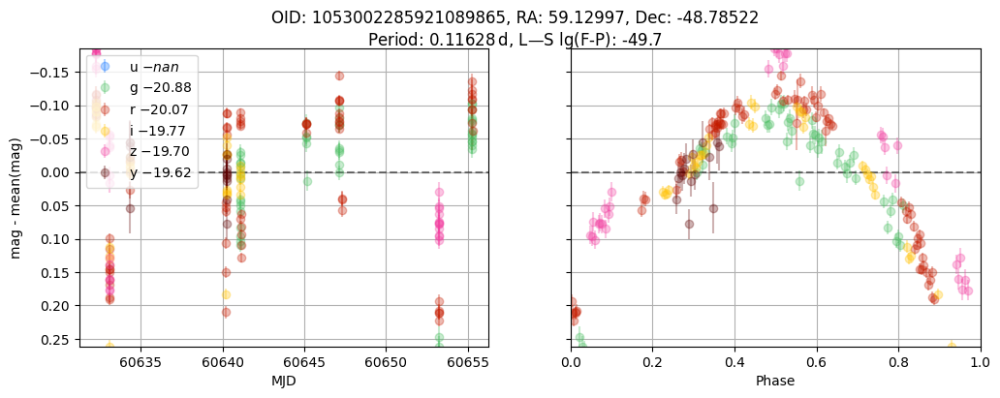

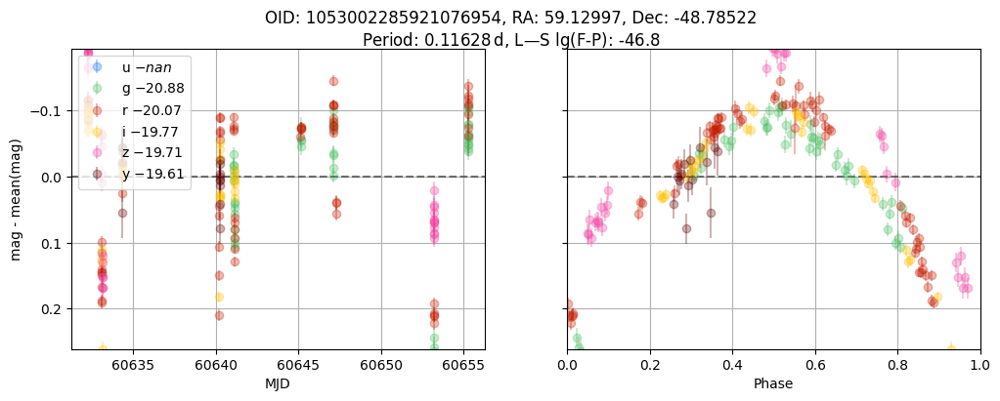

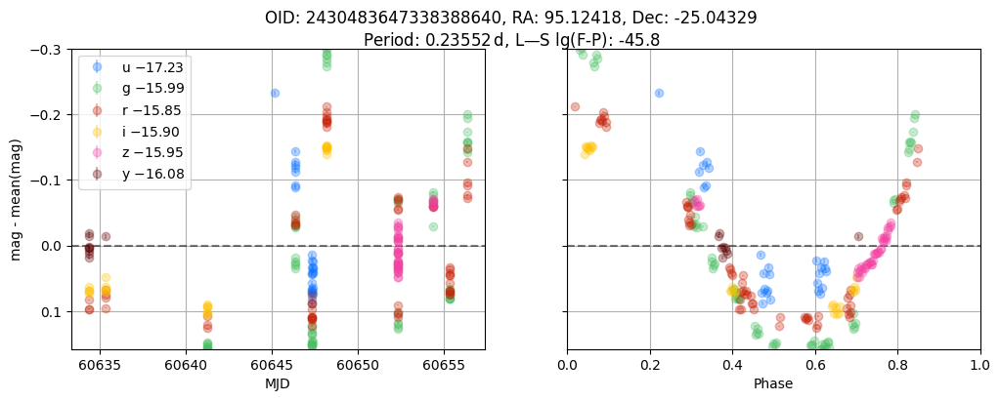

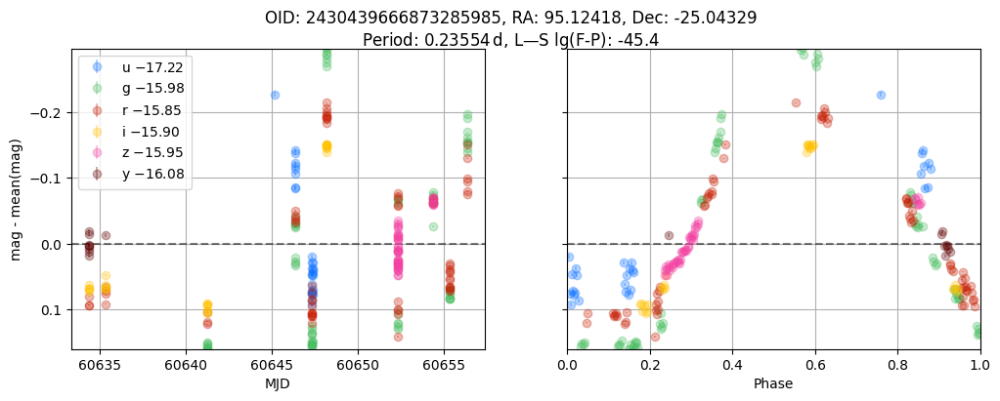

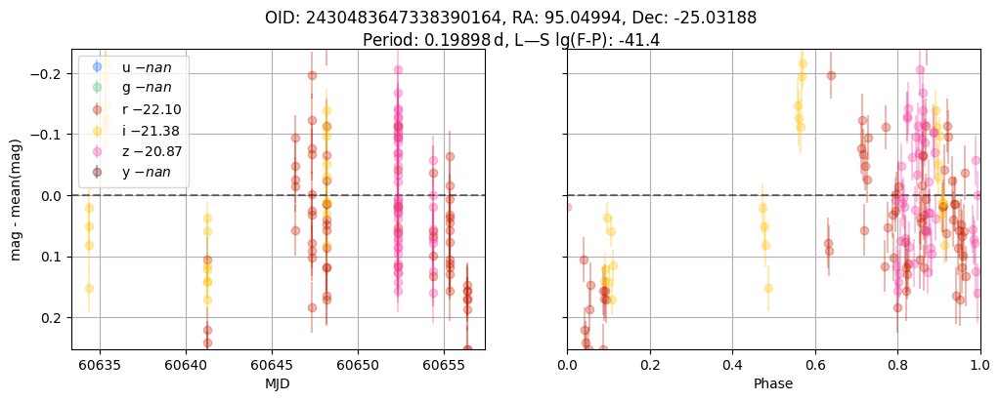

...

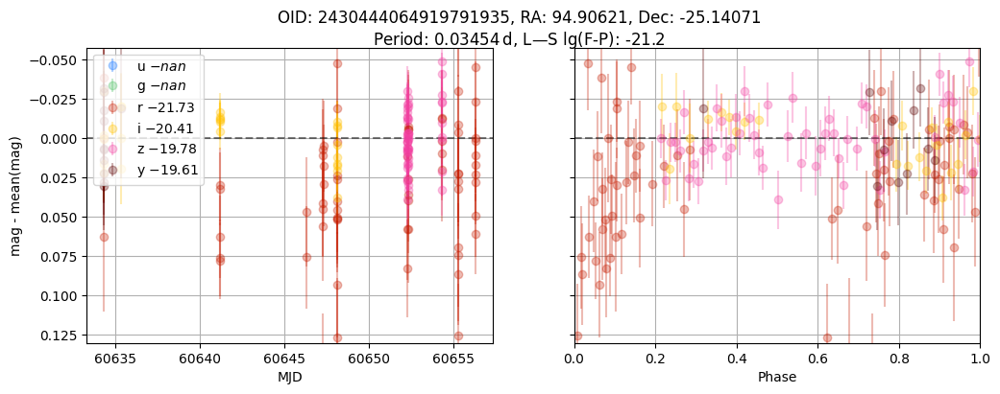

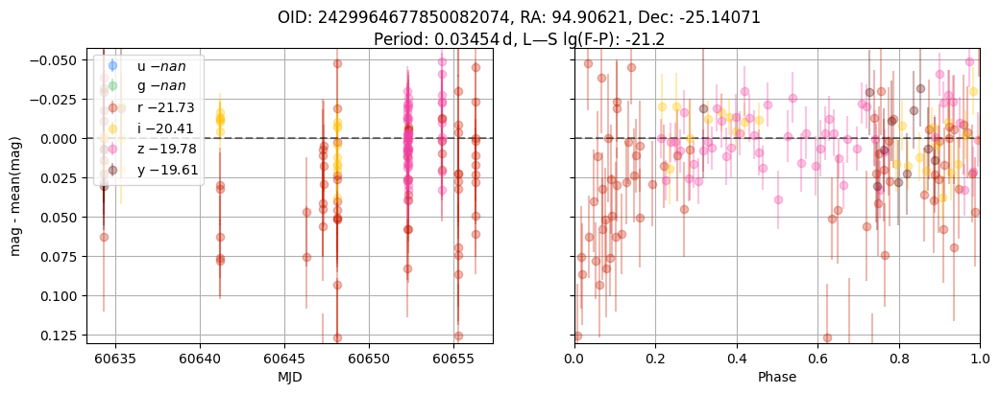

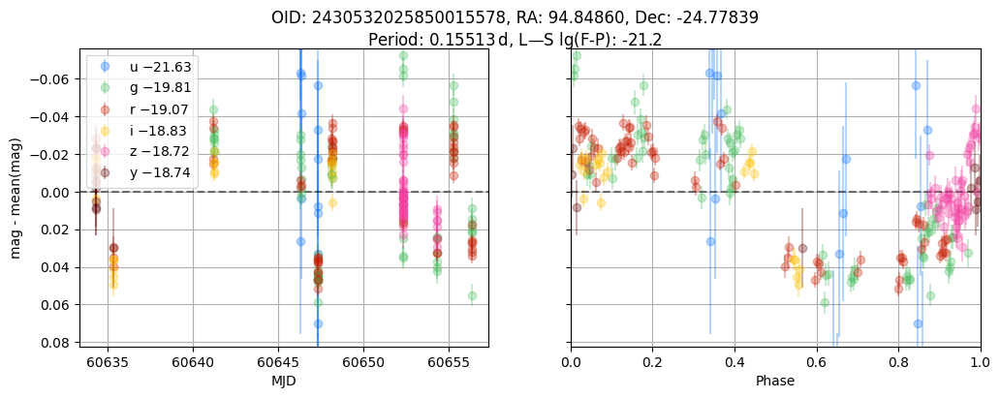

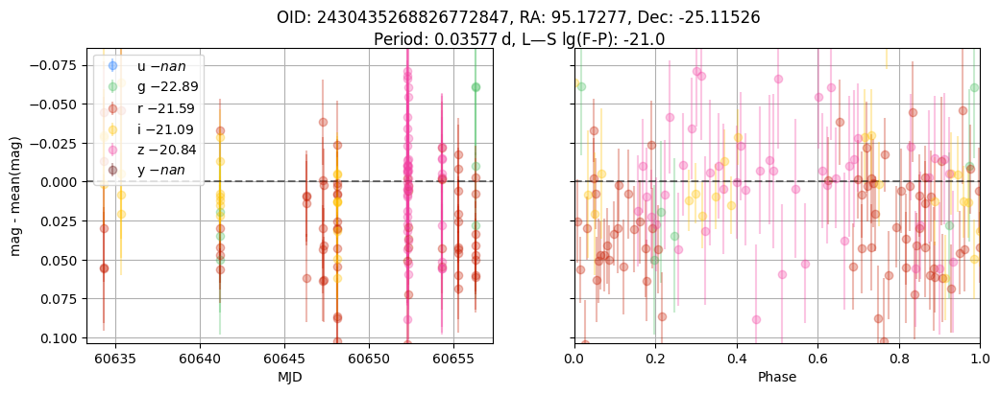

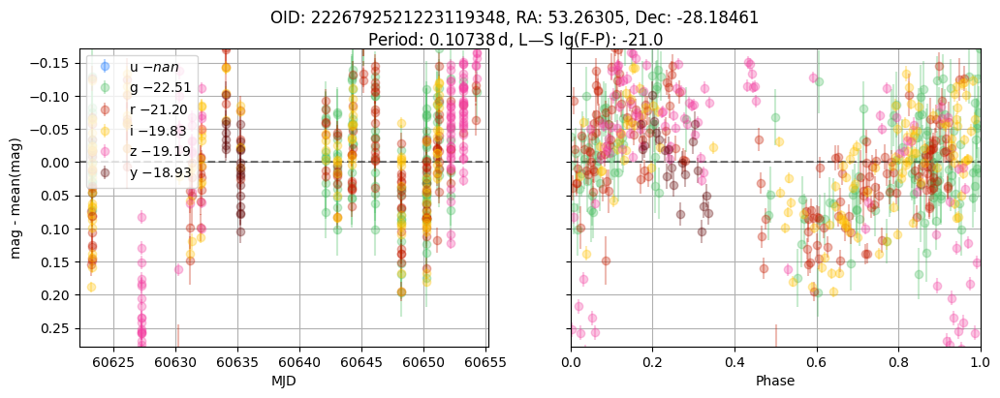

In [17]:
import matplotlib.pyplot as plt

COLORS = {'u': '#0c71ff', 'g': '#49be61', 'r': '#c61c00',
          'i': '#ffc200', 'z': '#f341a2', 'y': '#5d0000'}

FOLDED = True

for healpix29, cand in cand_subset.iloc[:50].iterrows():
    phase = cand.lc["midpointMJDTai"] % cand["period_0"] / cand["period_0"]
    mag = -2.5 * np.log10(cand.lc["psfFlux"]) + 31.4
    magerr = 2.5 / np.log(10) * cand.lc["psfFluxErr"] / cand.lc["psfFlux"]
    fig, (ax_mjd, ax_phase) = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
    all_delta_mag = []
    for b in BANDS:
        idx = (cand.lc["band"] == b) & (magerr < 0.1)
        mean_band_mag = np.mean(mag[idx])
        delta_mag = mag[idx] - mean_band_mag
        all_delta_mag.append(delta_mag)
        errorbar_kwargs = dict(
            y=delta_mag,
            yerr=magerr[idx],
            fmt="o",
            color=COLORS[b],
            label=f'{b} $- {mean_band_mag:.2f}$',
            alpha=0.3,
        )
        ax_mjd.errorbar(cand.lc["midpointMJDTai"][idx], **errorbar_kwargs)
        ax_phase.errorbar(phase[idx], **errorbar_kwargs)
    fig.suptitle(
        f"OID: {cand.objectId}, RA: {cand['coord_ra']:.5f}, Dec: {cand['coord_dec']:.5f}"
        f"\nPeriod: {cand['period_0']:.5f}$\,$d, L—S lg(F-P): {np.log10(cand['period_0_false_alarm_prob']):.1f}"
    )
    ax_mjd.set_ylabel("mag - mean(mag)")

    ax_mjd.set_xlabel("MJD")
    ax_mjd.set_xlim(np.min(cand.lc["midpointMJDTai"])-1, np.max(cand.lc["midpointMJDTai"])+1)
    ax_phase.set_xlabel("Phase")
    ax_phase.set_xlim(0, 1)
    
    max_abs_ylim = max(np.abs(plt.ylim()))
    y_lim_min, y_lim_max = np.quantile(np.concatenate(all_delta_mag), [0.01, 0.99])
    plt.ylim(y_lim_min, y_lim_max)
    plt.gca().invert_yaxis()
    ax_mjd.plot(ax_mjd.get_xlim(), [0, 0], color='k', linestyle='--', alpha=0.5)
    ax_phase.plot(ax_phase.get_xlim(), [0, 0], color='k', linestyle='--', alpha=0.5)
    ax_mjd.legend(loc='upper left')
    ax_mjd.grid()
    ax_phase.grid()
    
    plt.savefig(f"periodic_cand-{release}-{cand.objectId}.pdf")

    print(cand.objectId)